In [13]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

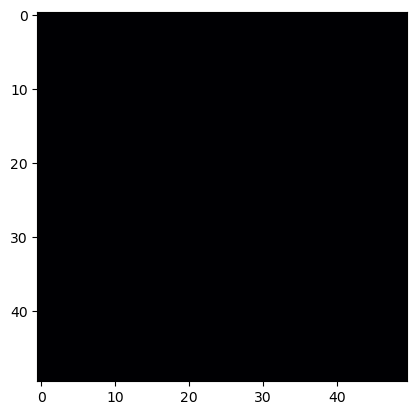

In [16]:
class Sandpile:
    def __init__(self, n):
        self.sandGrid = np.zeros((n, n))
        self.sandGrid += 3

    def update(self, frame, im):
        self.sandGrid[25, 25] += 10  # Increment by 10 instead of 1
        while np.any(self.sandGrid >= 4):
            indexvec = np.where(self.sandGrid >= 4)
            sel_ind = np.random.choice(np.arange(len(indexvec[0])))
            i, j = (indexvec[0][sel_ind], indexvec[1][sel_ind])
            self.sandGrid[i, j] -= 4
            if i > 0:
                self.sandGrid[i - 1, j] += 1
            if j > 0:
                self.sandGrid[i, j - 1] += 1
            if i < (n - 1):
                self.sandGrid[i + 1, j] += 1
            if j < (n - 1):
                self.sandGrid[i, j + 1] += 1
        im.set_array(self.sandGrid)
        return im,

n = 50
sandpile = Sandpile(n)
fig, ax = plt.subplots()
im = ax.imshow(sandpile.sandGrid, cmap='magma')

ani = FuncAnimation(fig, sandpile.update, frames=1000, fargs=(im,), interval=200, blit=False)  # Increase interval

# Display the animation in the notebook
HTML(ani.to_jshtml())